##Cyclegan
In this notebook, the training and testing of cycleGAN using photo2monet dataset is explained for question4.


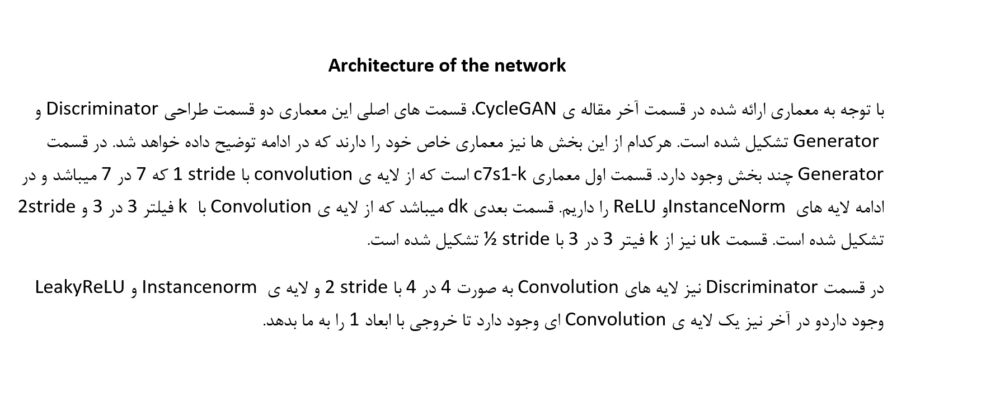

##Importing dataset

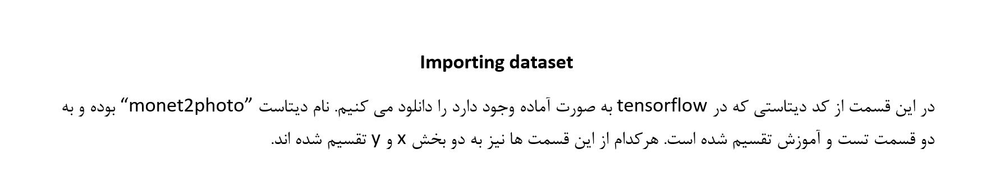

In [31]:
import tensorflow_datasets as tfds

data, metadata = tfds.load('cycle_gan/monet2photo', with_info = True, as_supervised = True)
train_x, train_y, test_x, test_y = data['trainA'], data['trainB'], data['testA'], data['testB']

##Deciding the initial hyper parameters and optimizers


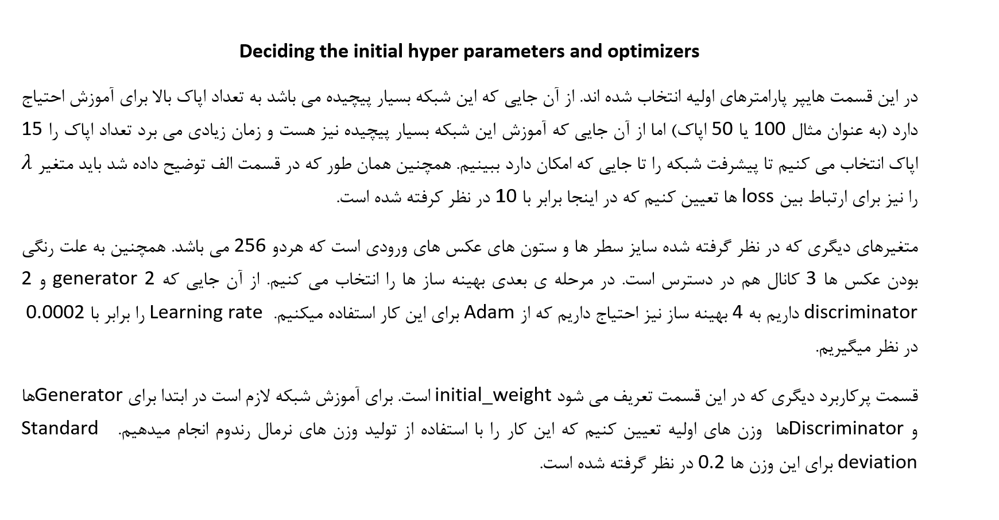

In [32]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal

epochs = 15
LAMBDA = 10

img_rows , img_cols , channels = 256, 256, 3
initial_weight = RandomNormal(stddev = 0.02) 

gen_g_optimizer = gen_f_optimizer = Adam(lr = 0.0002 , beta_1 = 0.5)
dis_x_optimizer = dis_y_optimizer = Adam(lr = 0.0002 , beta_1 = 0.5)

##Preprocessing data

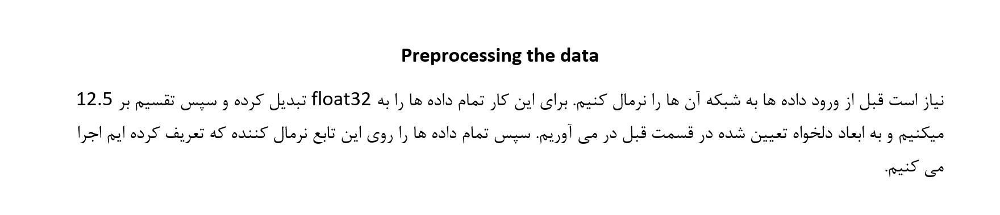

In [33]:
import tensorflow as tf

def preprocess_image(image, _):
  return tf.reshape(tf.cast(tf.image.resize(image, (int(img_rows), int(img_cols))), tf.float32) / 127.5 - 1, (1, img_rows, img_cols, channels))

#--------------------------------------
  
train_x = train_x.map(preprocess_image)
train_y = train_y.map(preprocess_image)
test_x = test_x.map(preprocess_image)
test_y = test_y.map(preprocess_image)

##Fundumental Blocks

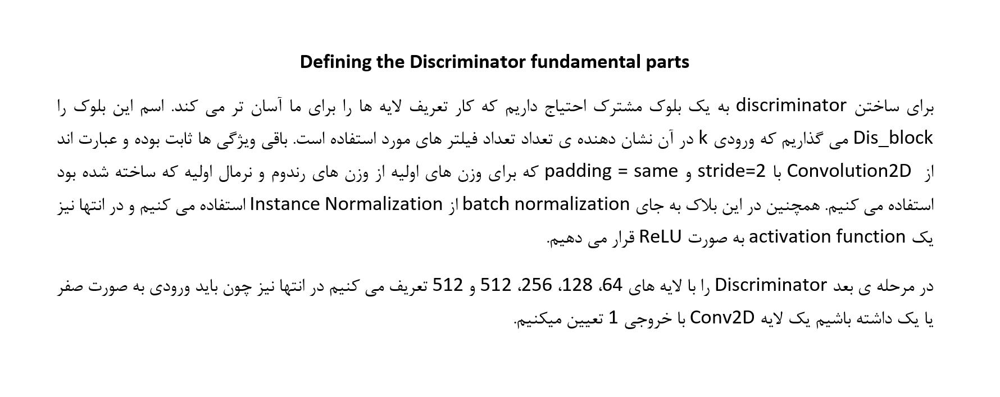

In [34]:
from tensorflow.keras.layers import Conv2D , ReLU , LeakyReLU
from tensorflow_addons.layers import InstanceNormalization

def Dis_block(input , k , use_instancenorm = True):
  block = Conv2D(k , (4,4) , strides = 2 , padding = 'same', kernel_initializer = initial_weight)(input)
  if use_instancenorm :
    block = InstanceNormalization(axis = -1)(block)
  # block = ReLU()(block)
  block = LeakyReLU(0.2)(block)

  return block

In [35]:
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model

def discriminator():
  input_layer = Input(shape = (img_rows , img_cols , channels))

  dlayer = Dis_block(input_layer , 64 , False)
  dlayer = Dis_block(dlayer , 128)
  dlayer = Dis_block(dlayer , 256)
  dlayer = Dis_block(dlayer , 512)
  

  dlayer = Conv2D(1 , (4,4), padding = 'same', kernel_initializer=initial_weight)(dlayer)

  dis  = Model(input_layer , dlayer)
  dis.compile(loss = 'mean_squared_error' , optimizer = dis_x_optimizer)
  return dis

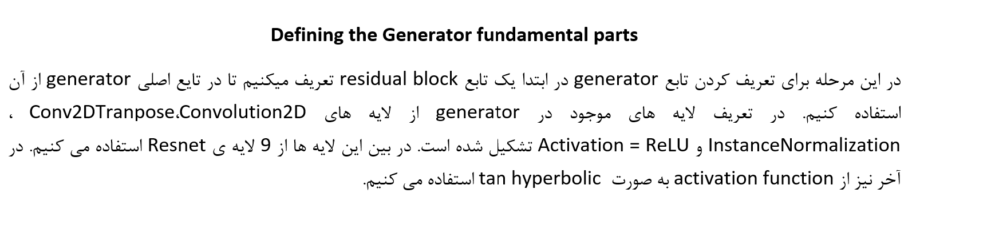

In [37]:
# #importing the libraries

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2DTranspose, Activation
from tensorflow_addons.layers import InstanceNormalization
from tensorflow.keras.layers import Input, Concatenate, Conv2DTranspose
from tensorflow.keras.models import Model

def resnet_block(n_filters, input_layer):
  g = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=initial_weight)(input_layer)
  g = InstanceNormalization(axis=-1)(g)
  g = Activation('relu')(g)
  g = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=initial_weight)(g)
  g = InstanceNormalization(axis=-1)(g)
  g = Concatenate()([g, input_layer])
  return g


def generator(n_resnet=6):
  input_layer = Input(shape=(img_rows, img_cols, channels))
  g = Conv2D(64, (7,7), padding='same', kernel_initializer=initial_weight)(input_layer)
  g = InstanceNormalization(axis=-1)(g)
  g = Activation('relu')(g)
  g = Conv2D(128, (3,3), strides=(2,2), padding='same', kernel_initializer=initial_weight)(g)
  g = InstanceNormalization(axis=-1)(g)
  g = Activation('relu')(g)
  g = Conv2D(256, (3,3), strides=(2,2), padding='same', kernel_initializer=initial_weight)(g)
  g = InstanceNormalization(axis=-1)(g)
  g = Activation('relu')(g)

  for _ in range(n_resnet):
    g = resnet_block(256, g)

  g = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same', kernel_initializer=initial_weight)(g)
  g = InstanceNormalization(axis=-1)(g)
  g = Activation('relu')(g)
  g = Conv2DTranspose(64, (3,3), strides=(2,2), padding='same', kernel_initializer=initial_weight)(g)
  g = InstanceNormalization(axis=-1)(g)
  g = Activation('relu')(g)
  g = Conv2D(3, (7,7), padding='same', kernel_initializer=initial_weight)(g)
  g = InstanceNormalization(axis=-1)(g)
  output_layer = Activation('tanh')(g)
  model = Model(input_layer, output_layer)
  return model

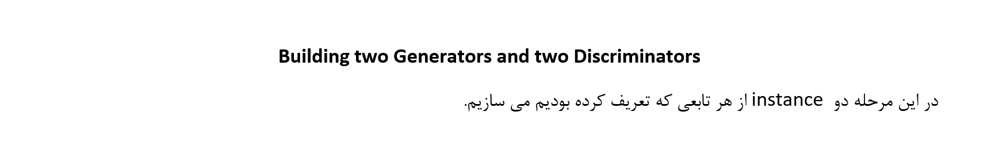

In [38]:
generator_g = generator()
generator_f = generator()

discriminator_x = discriminator()
discriminator_y = discriminator()

##Defining Loss Functions

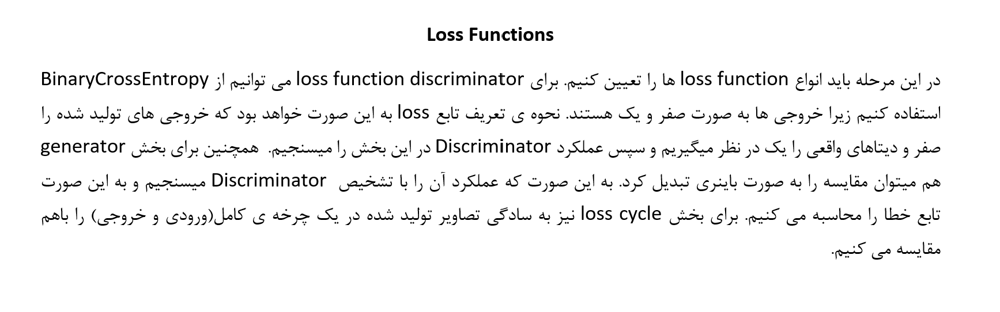

In [39]:
from tensorflow.keras.losses import BinaryCrossentropy, MSE

loss = BinaryCrossentropy(from_logits=True)
# loss = MSE


In [40]:
def discriminator_loss(real, generated):
  return(loss(tf.ones_like(real), real) + loss(tf.zeros_like(generated), generated))*0.5

In [41]:
def generator_loss(validity):
  return loss(tf.ones_like(validity) , validity)

In [42]:
def cycle_loss(image1 , image2):
  return tf.reduce_mean(tf.abs(image1 - image2))

#Training

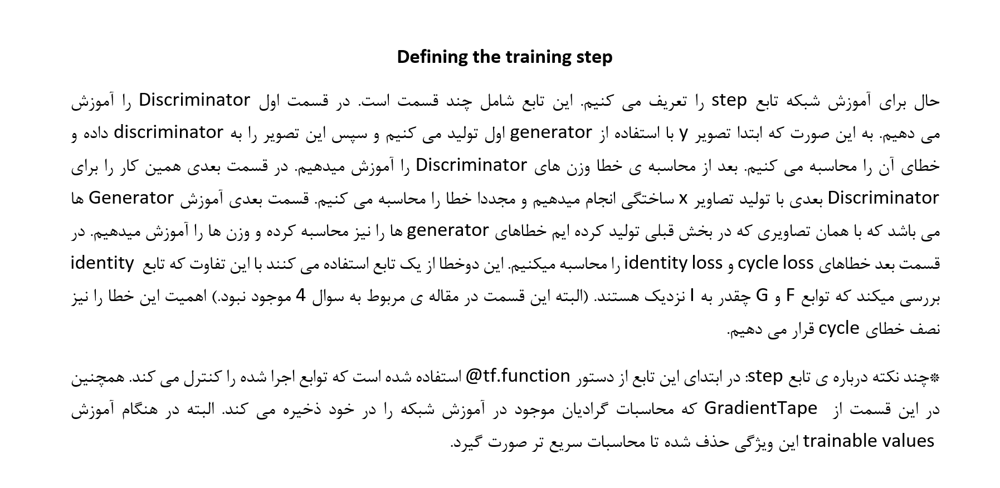

In [43]:
@tf.function
def step(real_x, real_y):



  with tf.GradientTape(persistent=True) as tape:
#training the discriminator
    fake_y = generator_g(real_x, training=True)
    gen_g_validity = discriminator_y(fake_y, training=True)
    dis_y_loss = discriminator_loss(discriminator_y(real_y, training=True), gen_g_validity)

    with tape.stop_recording():
      discriminator_y_gradients = tape.gradient(dis_y_loss, discriminator_y.trainable_variables)
      dis_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))

# #training the generator
    fake_x = generator_f(real_y, training=True)
    gen_f_validity = discriminator_x(fake_x, training=True)
    dis_x_loss = discriminator_loss(discriminator_x(real_x, training=True), gen_f_validity)

    with tape.stop_recording():
      discriminator_x_gradients = tape.gradient(dis_x_loss, discriminator_x.trainable_variables)
      dis_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))

    # adversarial losses
    gen_g_adv_loss = generator_loss(gen_g_validity)
    gen_f_adv_loss = generator_loss(gen_f_validity)

    # cycle losses
    cyc_x = generator_f(fake_y, training=True)
    cyc_x_loss =cycle_loss(real_x, cyc_x)

    cyc_y = generator_g(fake_x, training=True)
    cyc_y_loss = cycle_loss(real_y, cyc_y)

    #identity losses
    id_x = generator_f(real_x, training=True)
    id_x_loss =cycle_loss(real_x, id_x)

    id_y = generator_g(real_y, training=True)
    id_y_loss =cycle_loss(real_y, id_y)
    
  
    gen_g_loss = gen_g_adv_loss + (cyc_x_loss + cyc_y_loss) * LAMBDA + id_y_loss * 0.5*LAMBDA
    gen_f_loss = gen_f_adv_loss + (cyc_x_loss + cyc_y_loss) * LAMBDA + id_x_loss * 0.5*LAMBDA


    with tape.stop_recording():
      generator_g_gradients = tape.gradient(gen_g_loss, generator_g.trainable_variables)
      gen_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))

      generator_f_gradients = tape.gradient(gen_f_loss, generator_f.trainable_variables)
      gen_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))
    return float( gen_g_loss), float(gen_f_loss)

      


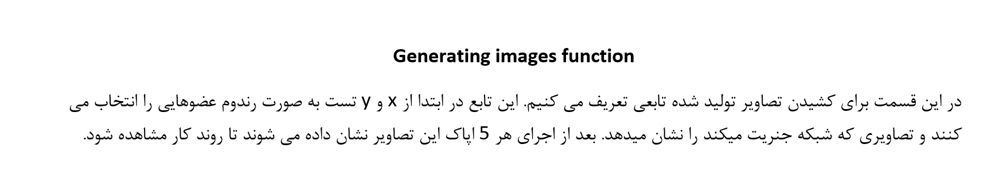

In [44]:

import matplotlib.pyplot as plt

def generate_images():
    
    x = next(iter(test_x.shuffle(1000))).numpy()
    y = next(iter(test_y.shuffle(1000))).numpy()

    
    gen_y = generator_g.predict(x.reshape((1, img_rows, img_cols, channels)))
    gen_x = generator_f.predict(y.reshape((1, img_rows, img_cols, channels)))
    
    
    plt.figure(figsize=(10, 10))

    images = [x[0], gen_y[0], y[0], gen_x[0]]

    for i in range(4):
        plt.subplot(2, 2, i+1)
        plt.imshow(images[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

**Training loop**

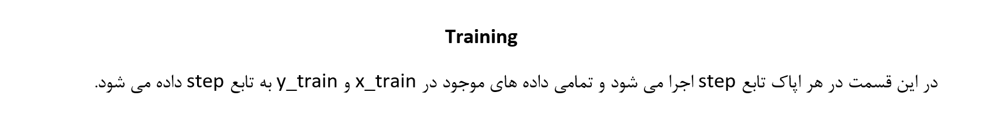

Epoch: 0
0
100
200
300
400
500
600
700
800
900
1000


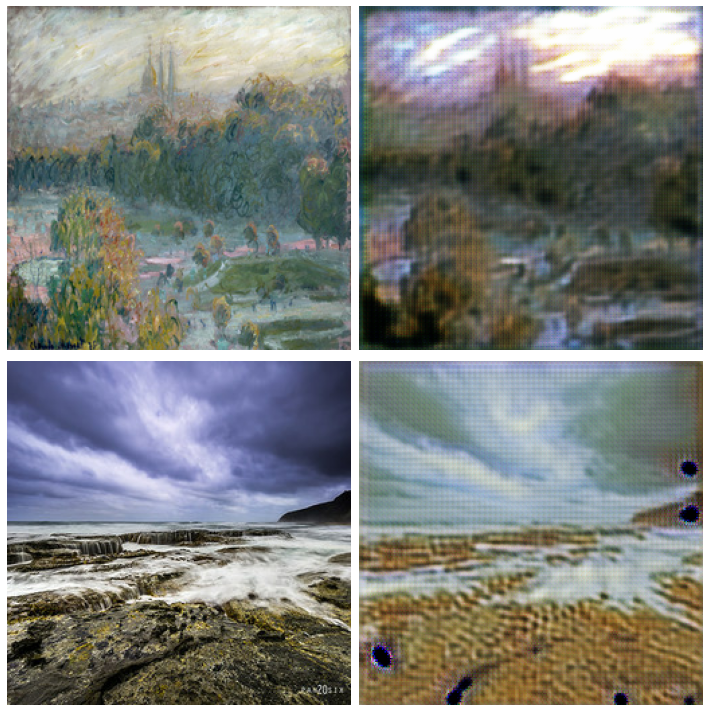

Time taken: 903.2058818340302
Epoch: 1
0
100
200
300
400
500
600
700
800
900
1000


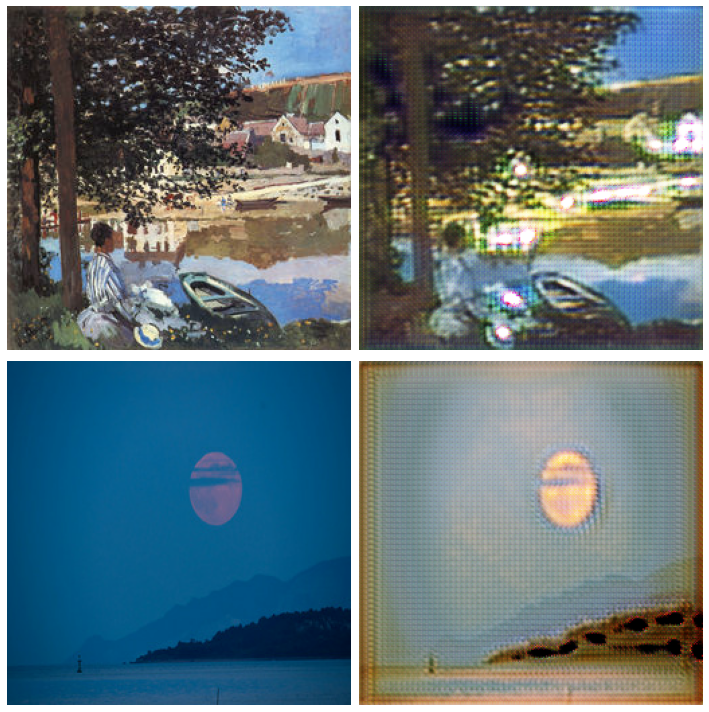

Time taken: 879.6658458709717
Epoch: 2
0
100
200
300
400
500
600
700
800
900
1000


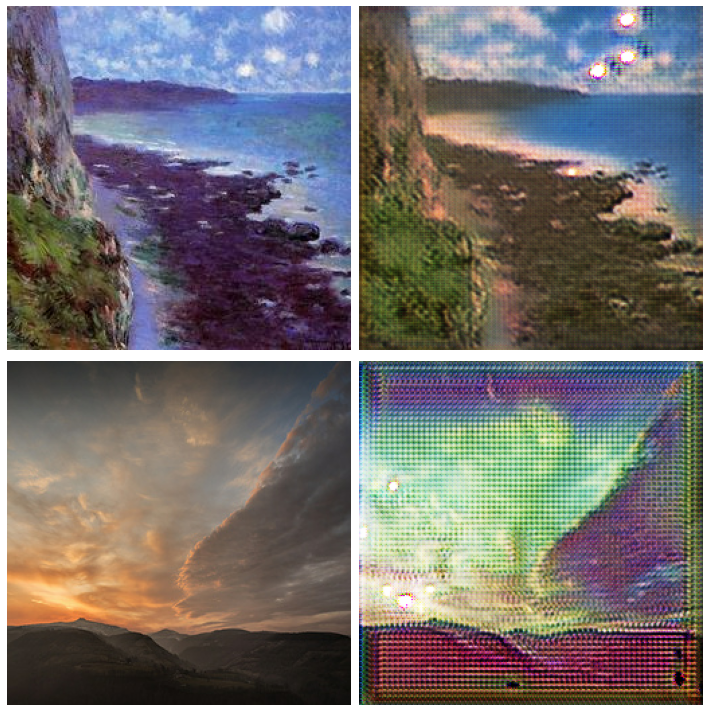

Time taken: 882.113706111908
Epoch: 3
0
100
200
300
400
500
600
700
800
900
1000


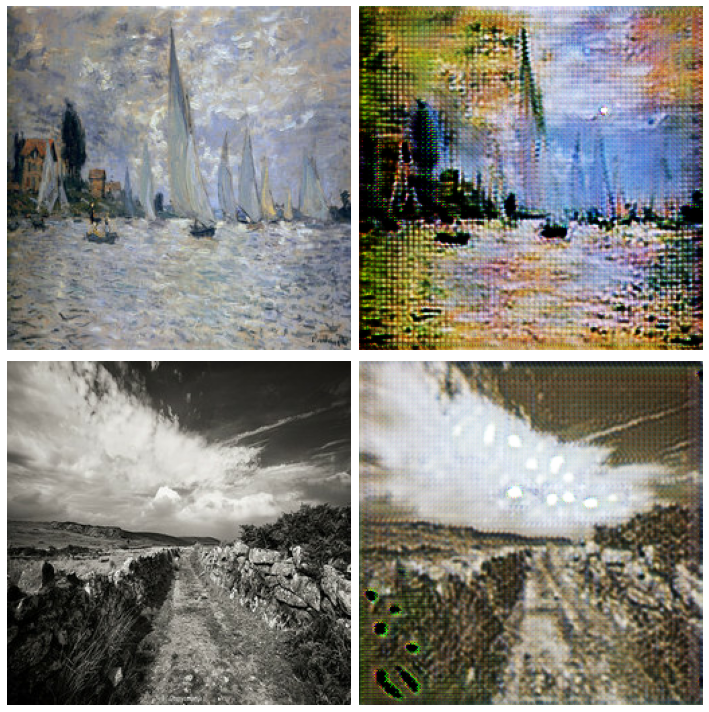

Time taken: 883.8118853569031
Epoch: 4
0
100
200
300
400
500
600
700
800
900
1000


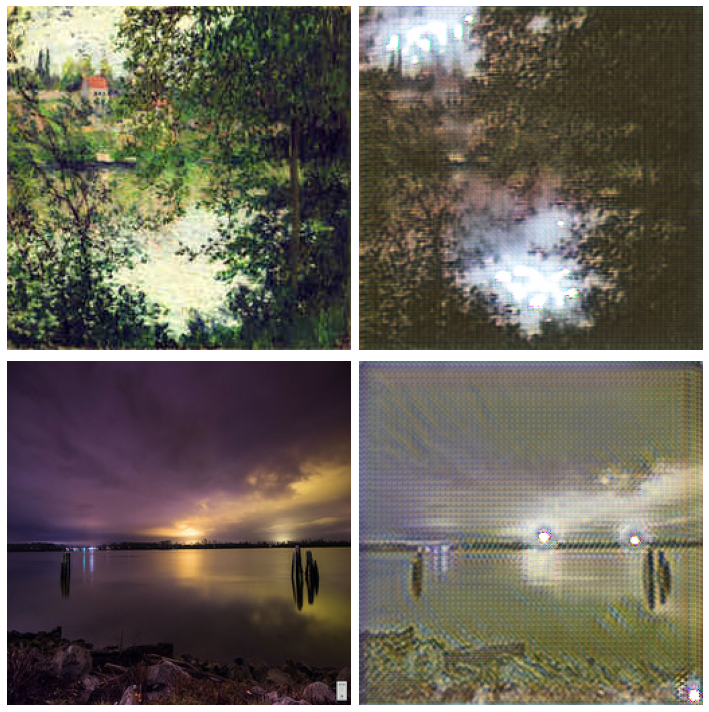

Time taken: 885.7136437892914
Epoch: 5
0
100
200
300
400
500
600
700
800
900
1000


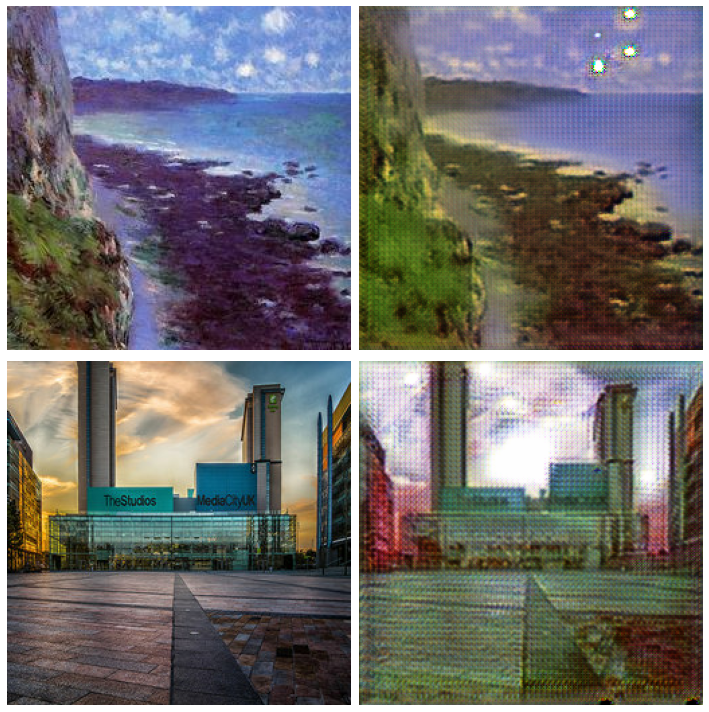

Time taken: 881.9254958629608
Epoch: 6
0
100
200
300
400
500
600
700
800
900
1000


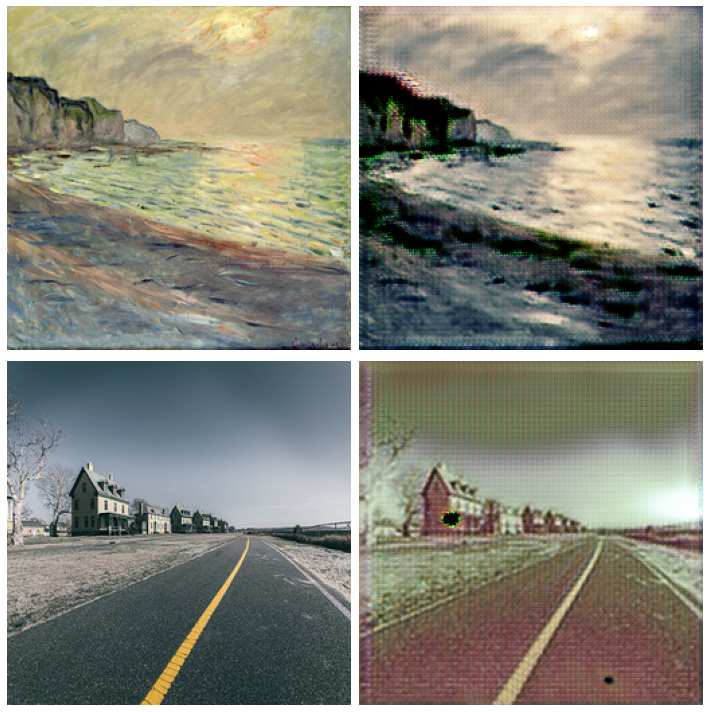

Time taken: 881.0688800811768
Epoch: 7
0
100
200
300
400
500
600
700
800
900
1000


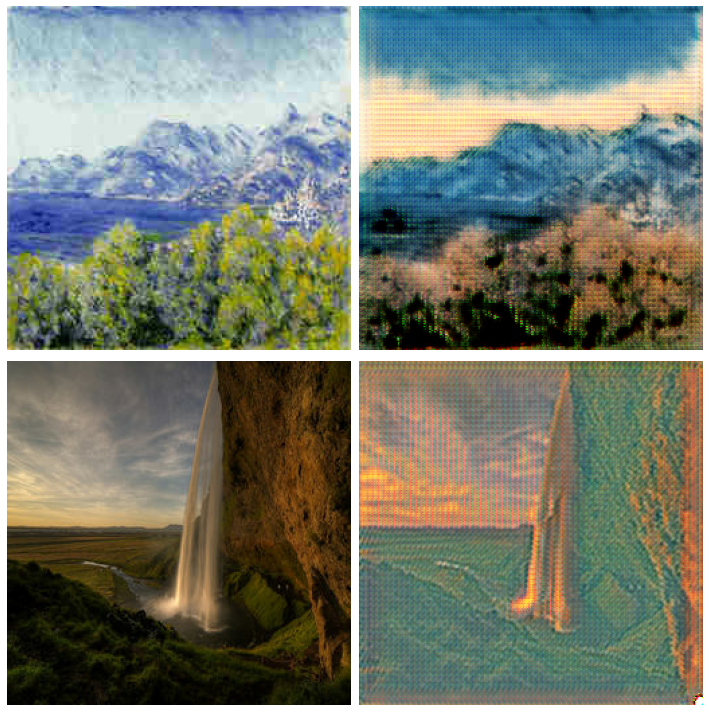

Time taken: 882.9794225692749
Epoch: 8
0
100
200
300
400
500
600
700
800
900
1000


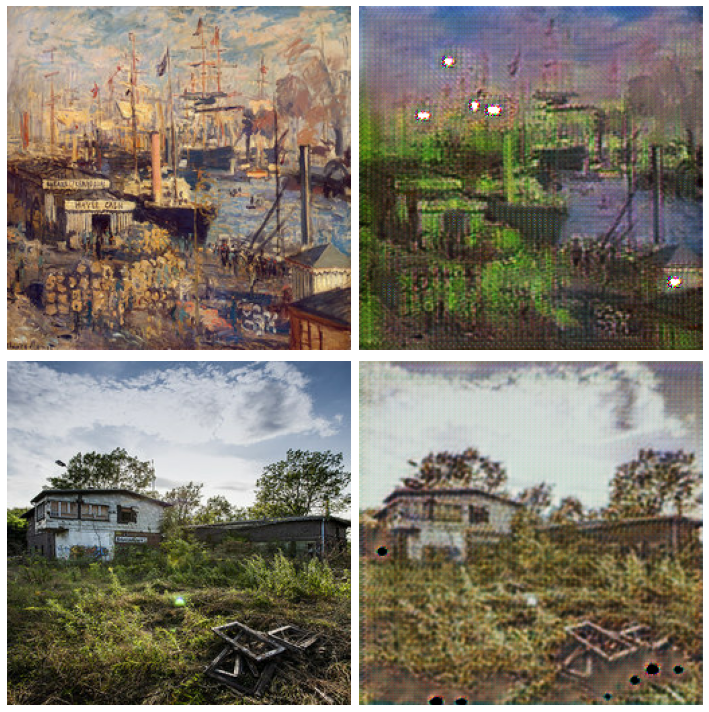

Time taken: 887.366443157196
Epoch: 9
0
100
200
300
400
500
600
700
800
900
1000


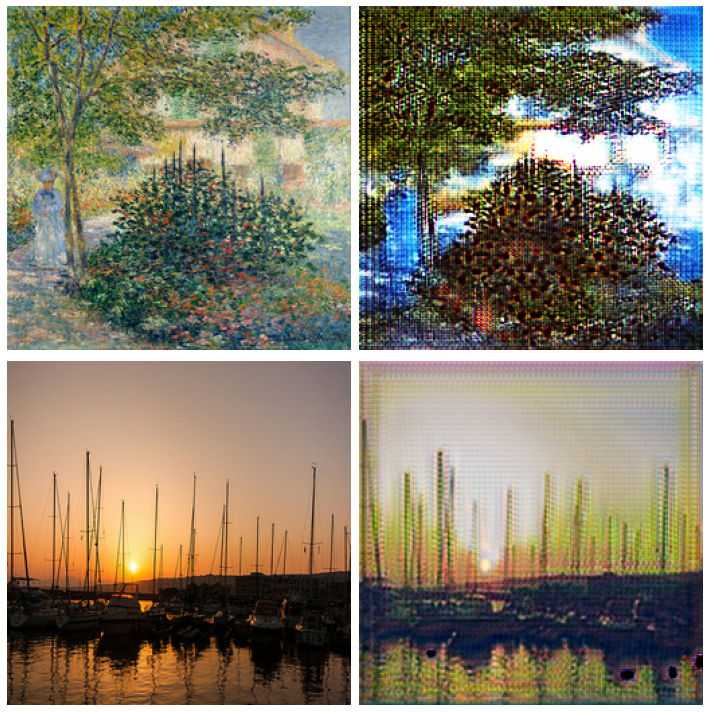

Time taken: 882.7492799758911
Epoch: 10
0
100
200
300
400
500
600
700
800
900
1000


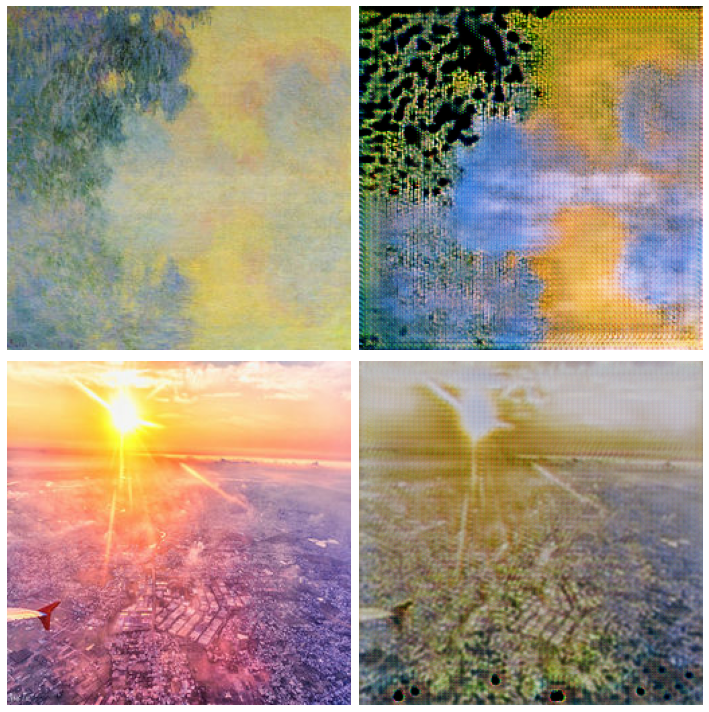

Time taken: 885.0946726799011
Epoch: 11
0
100
200
300
400
500
600
700
800
900
1000


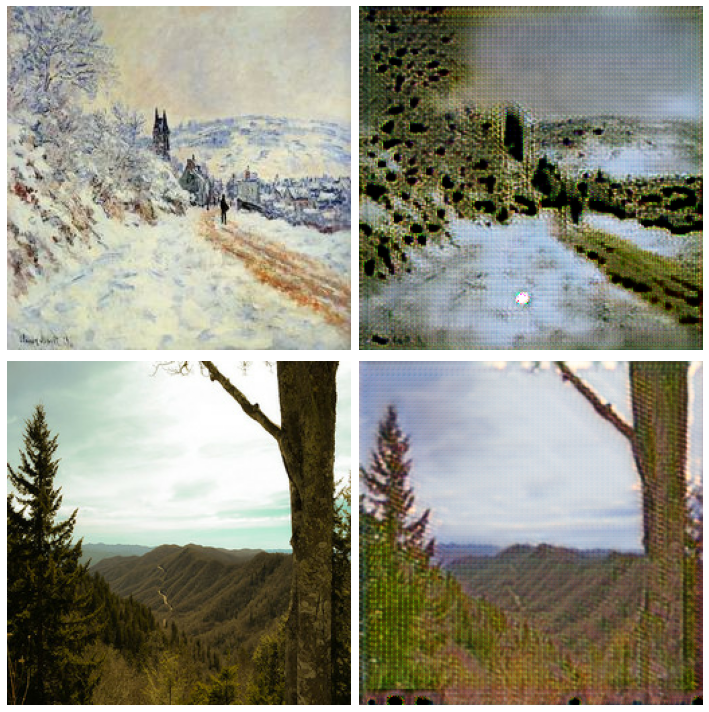

Time taken: 886.1629219055176
Epoch: 12
0
100
200
300
400
500
600
700
800
900
1000


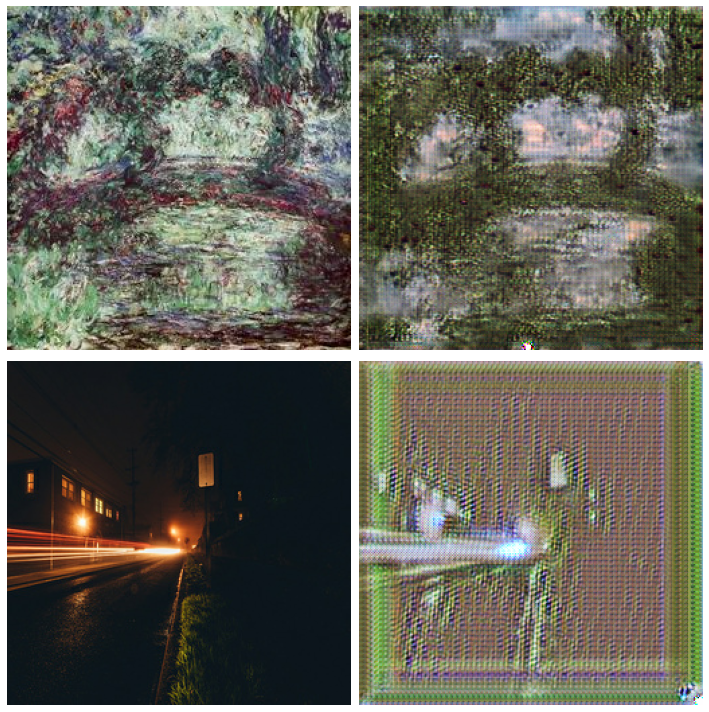

Time taken: 888.3932583332062
Epoch: 13
0
100
200
300
400
500
600
700
800
900
1000


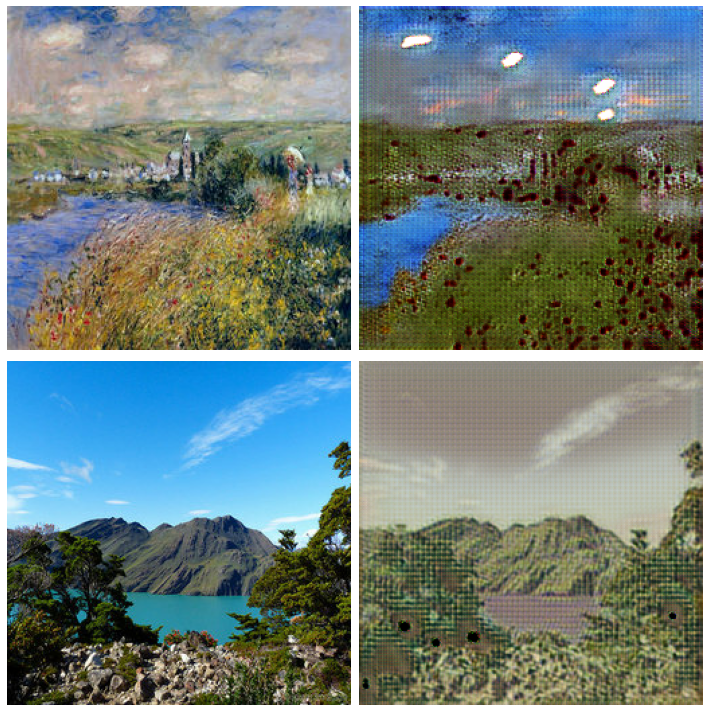

Time taken: 890.455554485321
Epoch: 14
0
100
200
300
400
500
600
700
800
900
1000


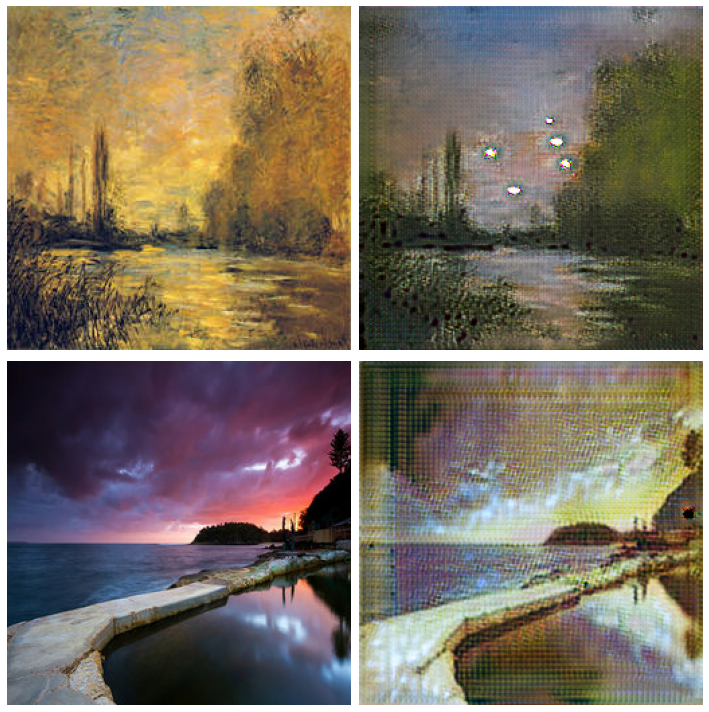

Time taken: 891.7679660320282


In [45]:
import time

lossglist = []
lossflist = []

for epoch in range(epochs):

  print('Epoch: {}'.format(epoch))
  start = time.time()

    
  for k, (real_x, real_y) in enumerate(tf.data.Dataset.zip((train_x, train_y))):
    if k % 100 == 0: 
      print(k)

    lossg, lossf = step(tf.reshape(real_x, (1, img_rows, img_cols, channels)), tf.reshape(real_y, (1, img_rows, img_cols, channels)))

  lossglist.append(lossg)
  lossflist.append(lossf)
    
    
  # if epoch%5 == 0:
  generate_images()

  print('Time taken: {}'.format(time.time() - start))

Text(0.5, 1.0, 'Loss for each epoch')

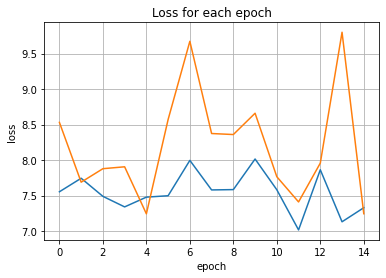

In [47]:
plt.plot(range(epochs), lossglist)
plt.plot(range(epochs), lossflist)
plt.ylabel('loss')
plt.xlabel('epoch')
plt.grid()
plt.title('Loss for each epoch')